In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [393]:
import numpy as np
from pathlib import Path
from skimage.io import imshow
import matplotlib.pyplot as plt
from matplotlib.axes import SubplotBase
from tqdm import tqdm
import random
import colorsys

from torch.utils.data import RandomSampler
from torchvision.transforms import ToTensor, RandomCrop, Resize, RandomResizedCrop, CenterCrop

from leaf.dta import LeafDataset, GetPatches, TransformPatches

In [372]:
def show_tensor(img):
    plt.imshow(img.numpy().transpose([1, 2, 0]))

In [373]:
train_dset = LeafDataset("./data/train_images", "./data/train_images/labels.csv")
val_dset = LeafDataset("./data/val_images", "./data/val_images/labels.csv")

In [374]:
def convert_to_hsv(a):
    return np.array(colorsys.rgb_to_hsv(*a.tolist()))

In [375]:
def test_colors(img, min_ratio=0.5, min_value=0.0, min_hue=50/360, max_hue=150/360):
    """Heuristic to test for 'leafness' of the IMG given as a channel-first float tensor rescaled to the range [0, 1]."""
    img_hsv = np.apply_along_axis(convert_to_hsv, axis=0, arr=img.reshape(3, -1))
#     img_flat_channels = img.reshape(3, -1)
#     img_hsv = np.zeros_like(img_flat_channels)
#     for pixel_i in range(img_flat_channels.shape[1]):
#         img_hsv[:, pixel_i] = np.array(colorsys.rgb_to_hsv(*img_flat_channels[:, pixel_i].tolist()))
    n_pixels = img_hsv.shape[1]
    return ((img_hsv[0, :] >= min_hue) & (img_hsv[0, :] <= max_hue) & (img_hsv[2, :] >= min_value)).sum() / n_pixels >= min_ratio

In [376]:
class RandomGreen(object):
    def __init__(self, size_x, size_y, min_ratio=0.5, min_value=0.0, min_hue=40/360, max_hue=160/360, keep_aspect_ratio=True):
        self.size_x = size_x
        self.size_y = size_y
        self.min_ratio = min_ratio
        self.min_value = min_value
        self.min_hue = min_hue
        self.max_hue = max_hue
        if keep_aspect_ratio:
            self.random_crop = RandomCrop(size=(size_y, size_x), pad_if_needed=True, fill=-1)
        else:
            self.random_crop = RandomResizedCrop(size=(size_y, size_x))
        self.resize = Resize(256)
        self.center_crop = CenterCrop(224)

    def __call__(self, img, max_tries=10):
        cand = self.random_crop(img)
        tries = 0
        while(not ((cand > -1).all() and test_colors(cand, self.min_ratio, self.min_value, self.min_hue, self.max_hue))):
            if tries == max_tries:
                cand = self.resize(cand)
                cand = self.center_crop(cand)
                failed_imgs.append(img)
                return cand
            nongreen_imgs.append(cand)
            cand = self.random_crop(img)
            tries += 1
        green_imgs.append(cand)
        return cand

In [377]:
random_green = RandomGreen(224, 224, min_ratio=0.3, min_value=0.0, min_hue=40/360, max_hue=170/360)

In [378]:
nongreen_imgs = []
green_imgs = []
failed_imgs = []

In [379]:
sampler = RandomSampler(train_dset, replacement=True, num_samples=1000)

In [380]:
for idx in tqdm(sampler):
    img = train_dset[idx][0]
    random_green(ToTensor()(img))

100%|██████████| 1000/1000 [03:16<00:00,  5.09it/s]


In [381]:
len(green_imgs)

998

In [382]:
len(nongreen_imgs)

71

In [383]:
len(failed_imgs)

2

In [415]:
def show_imgs(imgs, num_x=8, num_y=4):
    idxs = random.sample(range(len(imgs)), num_x * num_y)
    fig, axs = plt.subplots(num_y, num_x)
    fig.set_size_inches(50 * num_x / 8, 25 * num_y / 4)    
    for ax, idx in zip(axs.flat, idxs):
        #print(type(ax))
        ax.imshow(imgs[idx].numpy().transpose([1, 2, 0]))
        ax.set_xticks([])
        ax.set_yticks([])

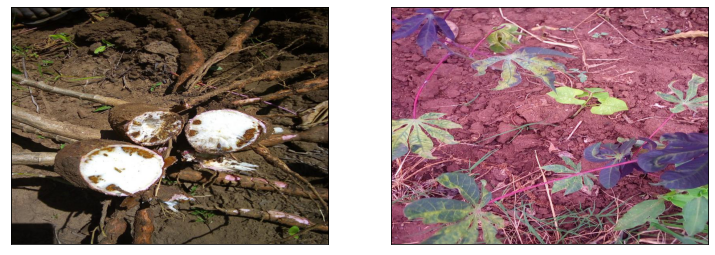

In [416]:
show_imgs(failed_imgs, num_x=2, num_y=1)

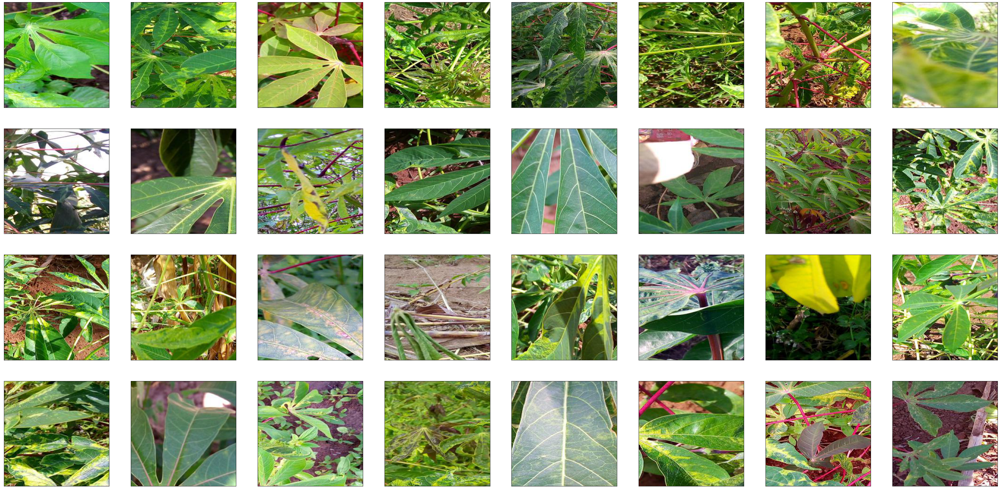

In [418]:
show_imgs(green_imgs)

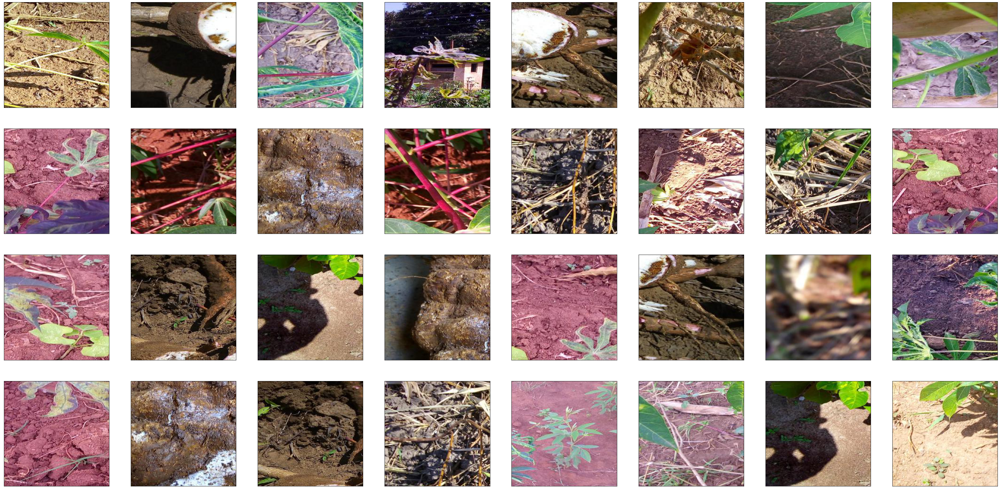

In [419]:
show_imgs(nongreen_imgs)

# Evaluation

`random_green = RandomGreen(224, 224, min_ratio=0.3, min_value=0.0, min_hue=50/360, max_hue=160/360)`

Out of 32 \* 3 = 96 *green* images: 5 were non-green

Out of first 32 non-green images: 24 were green

`random_green = RandomGreen(224, 224, min_ratio=0.4, min_value=0.0, min_hue=40/360, max_hue=170/360)`

Out of 32 \* 3 = 96 *green* images: 2-3 were non-green

Out of first 32 non-green images: 24 were green